# Install YOLOv8

In [2]:
!pip install ultralytics

from IPython import display
display.clear_output()

!yolo checks

Ultralytics YOLOv8.0.92  Python-3.8.0 torch-2.0.0+cpu CPU
Setup complete  (12 CPUs, 7.8 GB RAM, 150.7/458.8 GB disk)


In [3]:
from ultralytics import YOLO
from IPython.display import display, Image

# Training the model

In [3]:
# Loading a pretrained model
model = YOLO('./runs/detect/train/weights/best.pt')

# Use the model
model.train(data=f'./data.yaml', epochs=5)

Ultralytics YOLOv8.0.92  Python-3.8.0 torch-2.0.0+cpu CPU
yolo\engine\trainer: task=detect, mode=train, model=./runs/detect/train/weights/best.pt, data=./data.yaml, epochs=5, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=None, workspace=4, 

In [2]:
# Round 2. Model stopped while training on epoch 3.

model = YOLO('./runs/detect/train2/weights/last.pt')
model.train(data=f'./data.yaml', epochs=2)

New https://pypi.org/project/ultralytics/8.0.93 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.92  Python-3.8.0 torch-2.0.0+cpu CPU
yolo\engine\trainer: task=detect, mode=train, model=./runs/detect/train2/weights/last.pt, data=./data.yaml, epochs=2, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscri

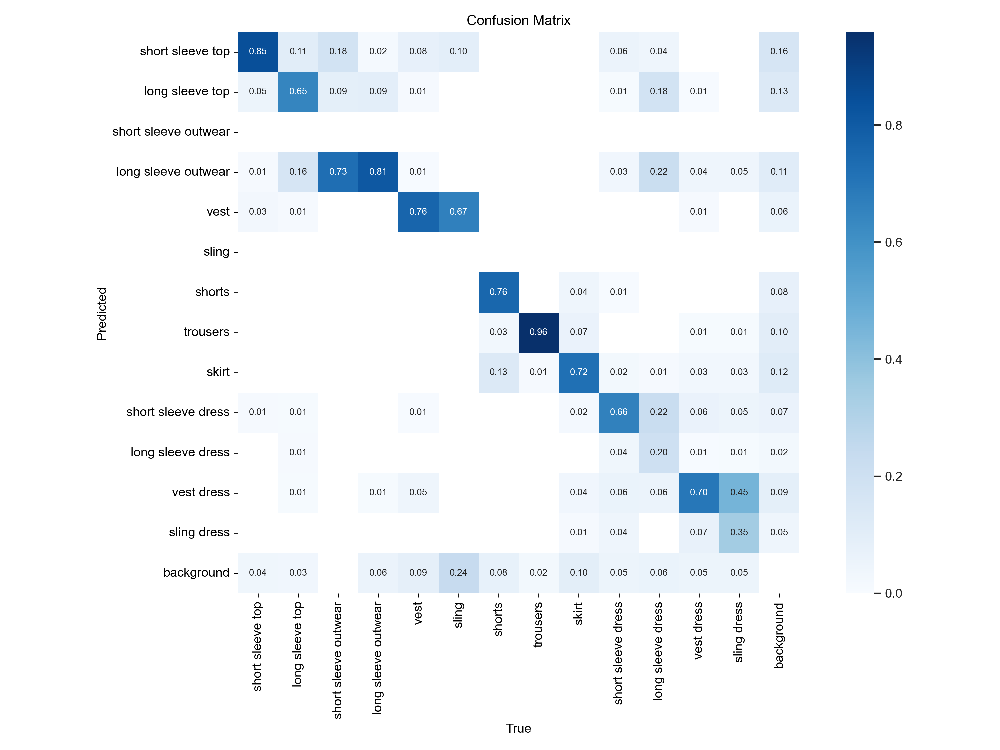

In [4]:
Image(filename=f'./runs/detect/train3/confusion_matrix.png')

# Testing model on a random image

In [35]:
import os
import cv2
import matplotlib.pyplot as plt
from random import sample

model = YOLO('./runs/detect/train3/weights/best.pt')

In [36]:
def predict(file):
    file_loc = './data/images/test/'+file
    predict_loc = './runs/detect/predict2/'+file
    model.predict(file_loc, conf=0.35, save=True)

    plt.figure(figsize=(15,15))

    # actual image
    plt.subplot(121)
    image = cv2.imread(file_loc)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB ))
    plt.xticks([])
    plt.yticks([])

    # predicted image
    plt.subplot(122)
    prediction=cv2.imread(predict_loc)
    plt.imshow(cv2.cvtColor(prediction, cv2.COLOR_BGR2RGB ))
    plt.xticks([])
    plt.yticks([])

    # Plot the image
    plt.plot()


image 1/1 C:\Users\MSI 1\Desktop\Fashion\data\images\test\174567.jpg: 640x576 1 short sleeve top, 3 trouserss, 135.9ms
Speed: 0.0ms preprocess, 135.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs\detect\predict2

image 1/1 C:\Users\MSI 1\Desktop\Fashion\data\images\test\065326.jpg: 640x416 1 short sleeve top, 1 short sleeve dress, 128.1ms
Speed: 0.0ms preprocess, 128.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs\detect\predict2

image 1/1 C:\Users\MSI 1\Desktop\Fashion\data\images\test\126955.jpg: 608x640 1 long sleeve outwear, 1 trousers, 143.9ms
Speed: 0.0ms preprocess, 143.9ms inference, 8.0ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs\detect\predict2

image 1/1 C:\Users\MSI 1\Desktop\Fashion\data\images\test\037653.jpg: 640x480 1 short sleeve top, 1 trousers, 136.1ms
Speed: 0.0ms preprocess, 136.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)
Resu

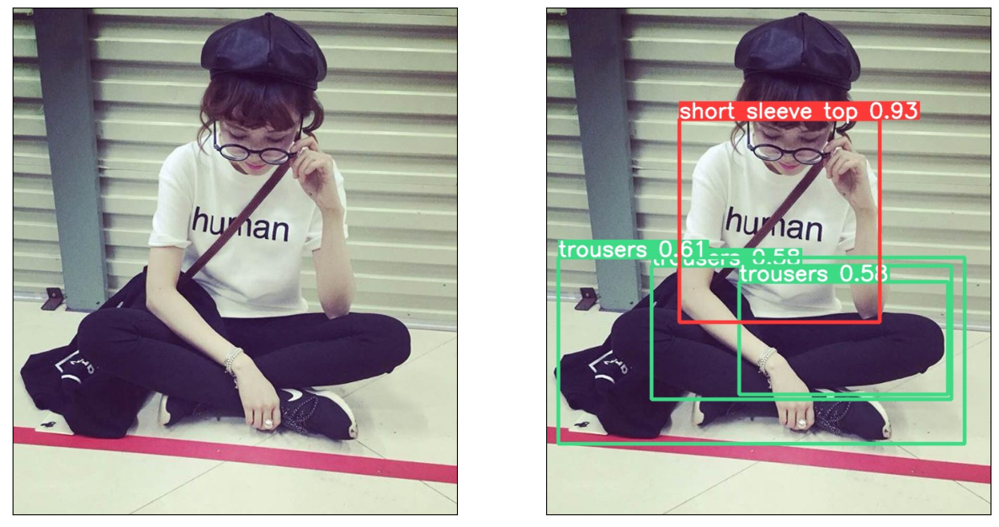

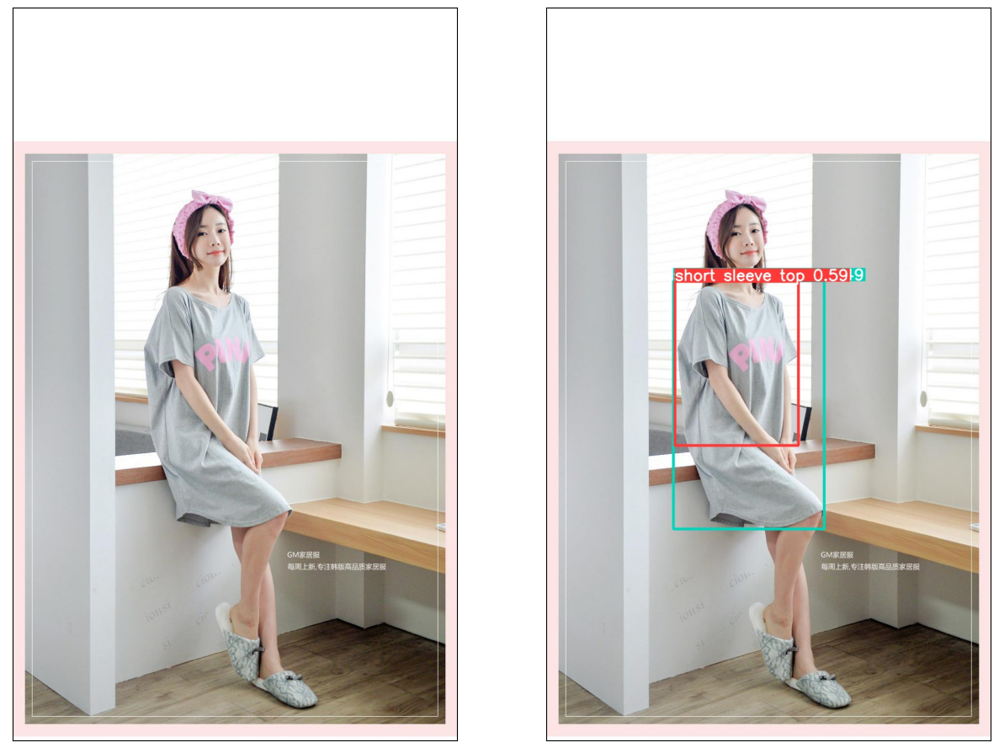

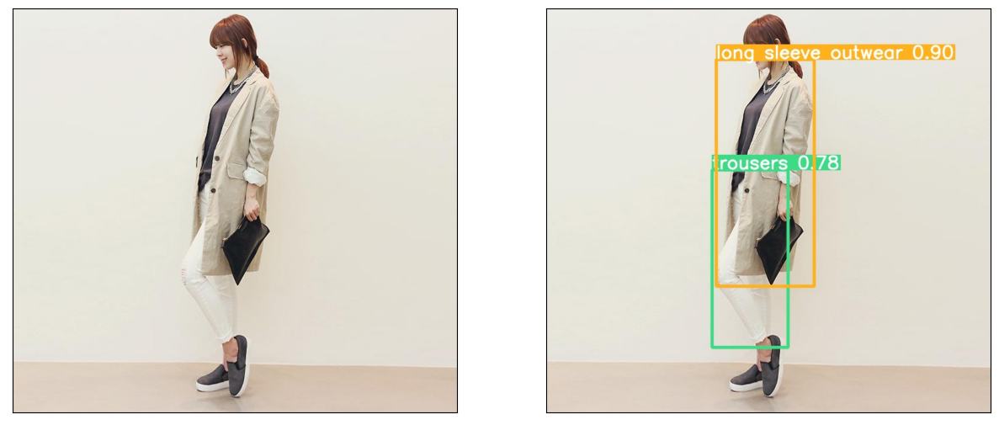

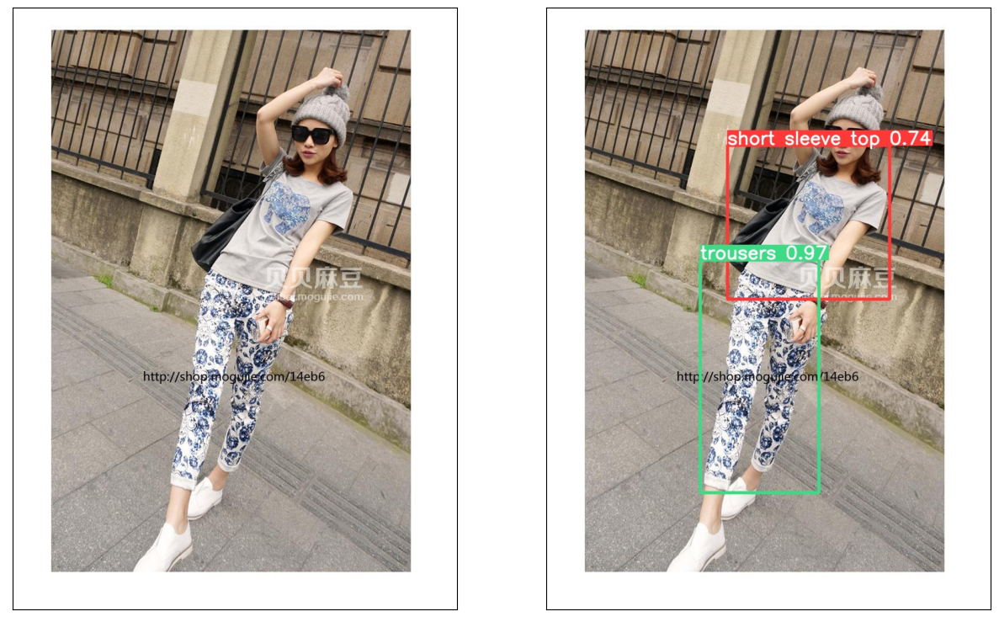

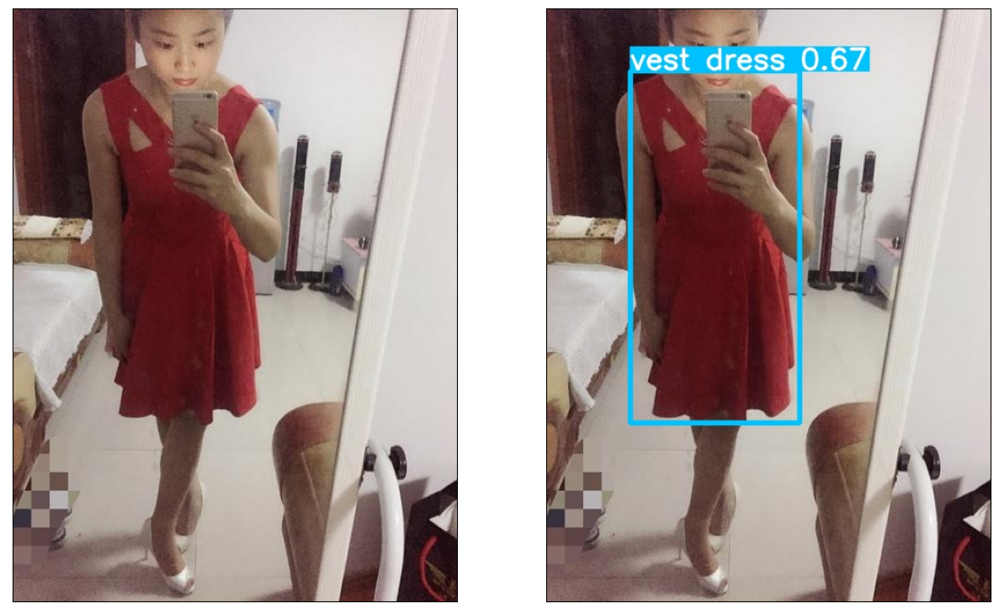

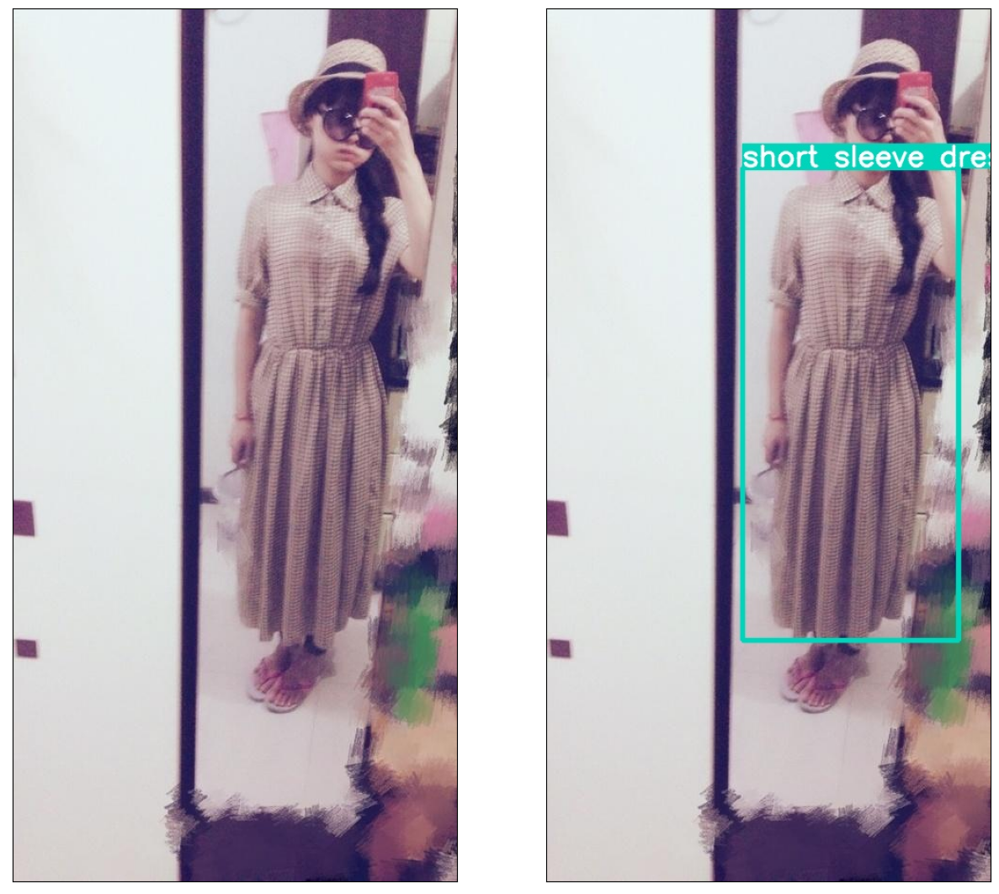

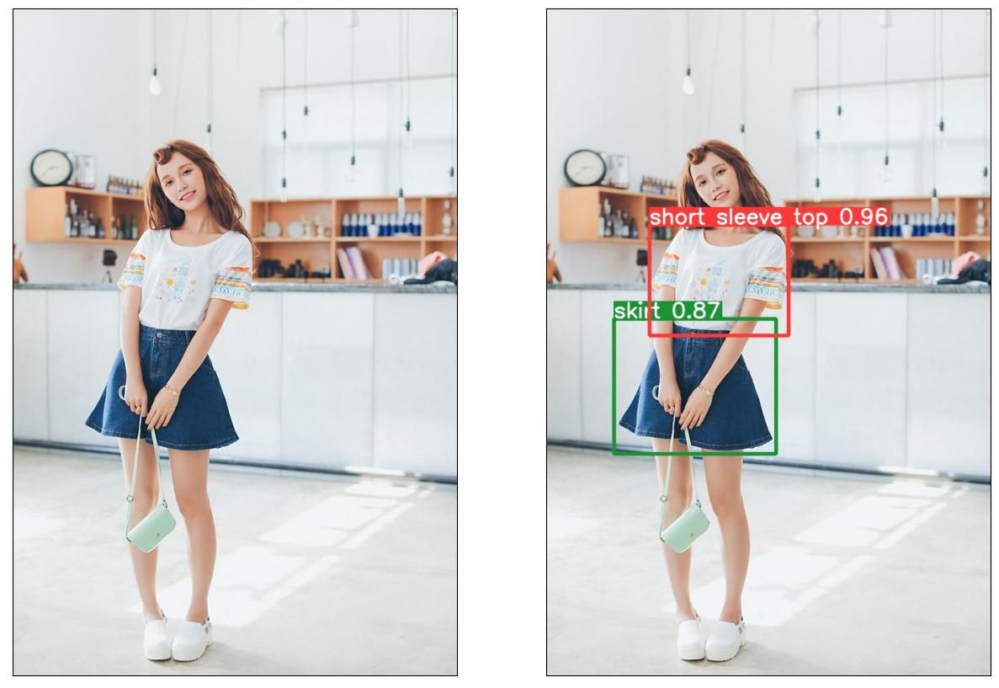

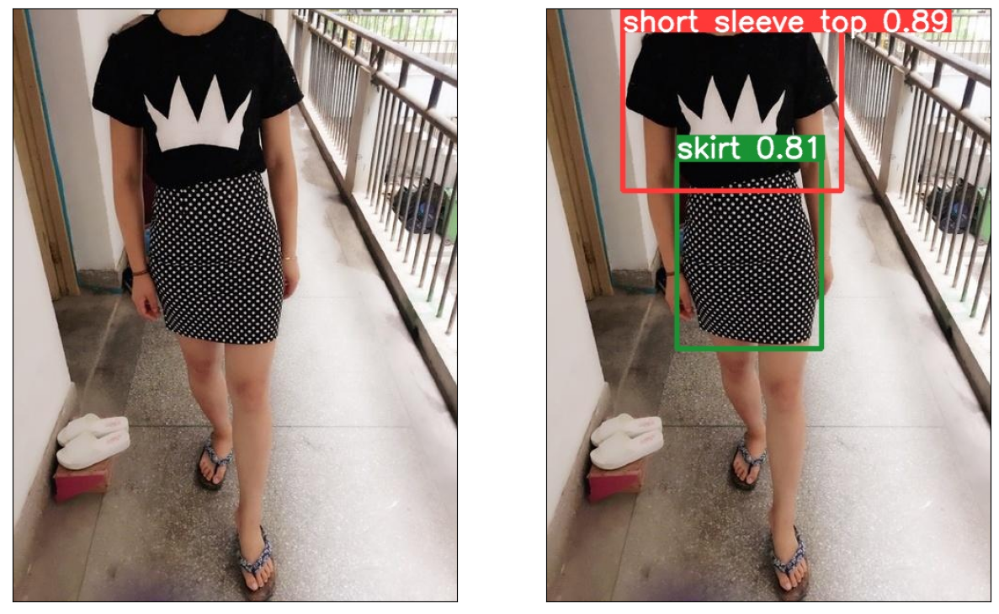

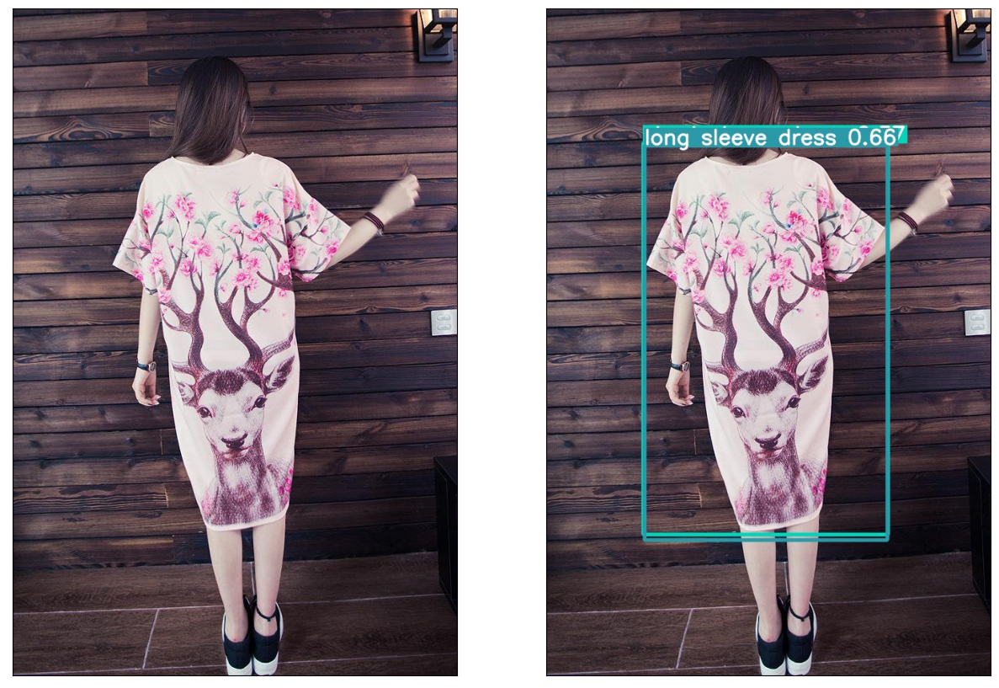

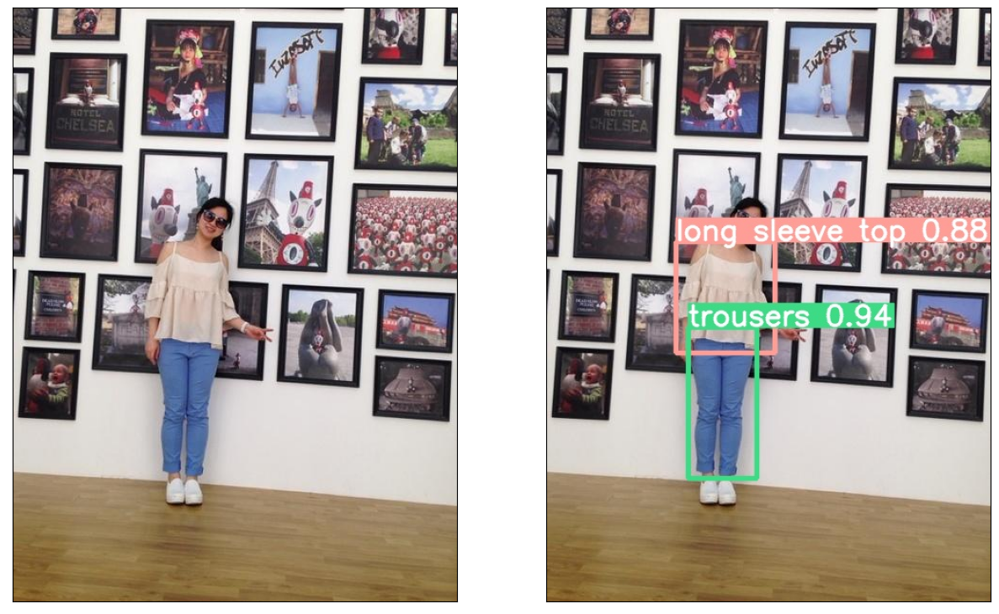

In [37]:
testing_files = sample(os.listdir('./data/images/test/'), 10)

for file in testing_files:
    predict(file)
    # print(file)

In [38]:
metrics = model.val()

Ultralytics YOLOv8.0.92  Python-3.8.0 torch-2.0.0+cpu CPU
val: Scanning C:\Users\MSI 1\Desktop\Fashion\data\labels\val.cache... 3704 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3704/3704 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 232/232 [09:24<00:00,  2.43s/it]
                   all       3704       6805      0.745      0.589      0.645      0.503
      short sleeve top       3704       1447      0.826      0.845      0.901      0.717
       long sleeve top       3704        890      0.801      0.715      0.836      0.653
  short sleeve outwear       3704         11          1          0     0.0644     0.0471
   long sleeve outwear       3704        298      0.477      0.832      0.732      0.564
                  vest       3704        310      0.667      0.731      0.776      0.554
                 sling       3704         21          1          0     0.0485     0.0331
                shorts    

array([    0.71695,       0.653,    0.047136,     0.56415,     0.55398,    0.033149,     0.68382,     0.76736,     0.55924,     0.55671,     0.40056,     0.55466,     0.45044])

In [41]:
print(metrics)

ultralytics.yolo.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])
box: ultralytics.yolo.utils.metrics.Metric object
confusion_matrix: <ultralytics.yolo.utils.metrics.ConfusionMatrix object at 0x0000022C0C998CA0>
fitness: 0.5173643915547834
keys: ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']
maps: array([    0.71695,       0.653,    0.047136,     0.56415,     0.55398,    0.033149,     0.68382,     0.76736,     0.55924,     0.55671,     0.40056,     0.55466,     0.45044])
names: {0: 'short sleeve top', 1: 'long sleeve top', 2: 'short sleeve outwear', 3: 'long sleeve outwear', 4: 'vest', 5: 'sling', 6: 'shorts', 7: 'trousers', 8: 'skirt', 9: 'short sleeve dress', 10: 'long sleeve dress', 11: 'vest dress', 12: 'sling dress'}
plot: True
results_dict: {'metrics/precision(B)': 0.7450299047985607, 'metrics/recall(B)': 0.5890219608173264, 'metrics/mAP50(B)': 0.645147837374741,